# Advanced Lan Finding


## The goals / steps of this project are the following
***

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
   The images for camera calibration are stored in the folder called camera_cal. The images in test_images are for   testing your pipeline on single frames. If you want to extract more test images from the videos, you can simply     use an image writing method like cv2.imwrite(), i.e., you can read the video in frame by frame as usual, and for   frames you want to save for later you can write to an image file.

To help the reviewer examine your work, please save examples of the output from each stage of your pipeline in the folder called ouput_images, and include a description in your writeup for the project of what each image shows. The video called project_video.mp4 is the video your pipeline should work well on.

The challenge_video.mp4 video is an extra (and optional) challenge for you if you want to test your pipeline under somewhat trickier conditions. The harder_challenge.mp4 video is another optional challenge and is brutal!

If you're feeling ambitious (again, totally optional though), don't stop there! We encourage you to go out and take video of your own, calibrate your camera and show us how you would implement this project from scratch!

## 0. Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline
import os
import glob
import copy

## 1. Camera Calibration
Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

### 1.1 Read Chess Board images

Chessboard Images


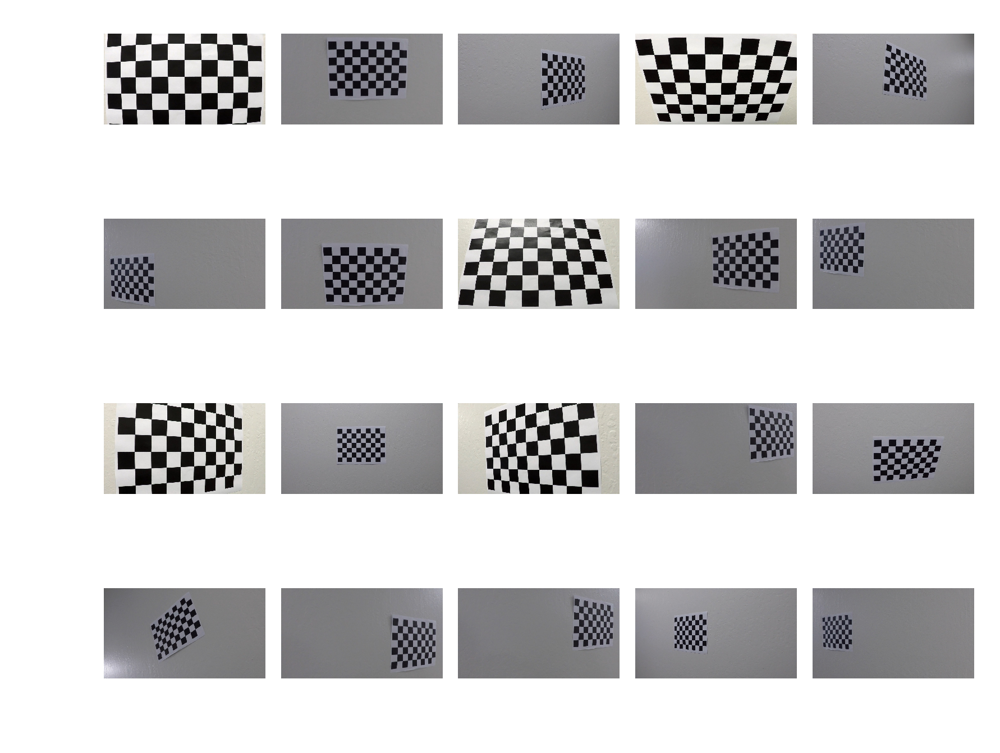

In [2]:
#####
# Reading chessboard image
chessboard_file_list = glob.glob(os.path.join("./camera_cal", '*.jpg'))
num_chessboard_file = len(chessboard_file_list)
#print(chessboard_file_list)
chessboard_img=[]
for f in chessboard_file_list:
    img = mpimg.imread(f)
    chessboard_img.append(img)

#####
# Visualizing chessboard images
print("Chessboard Images")
rows=4
cols=5
fig, ax = plt.subplots(rows, cols, figsize=(cols, rows), dpi=400)
fig.subplots_adjust(hspace = .5, wspace=.1)
for i in range(rows):
    for k in range(cols):
        ax[i][k].set_axis_off()
        if (i*cols+k)<num_chessboard_file:
            ax[i][k].imshow(chessboard_img[i*cols+k])
plt.show()
plt.close()



#define number of points which are already known values
nx = 9
ny = 6




### 1.2. Calibrate camera

Chessboard Images with Corners


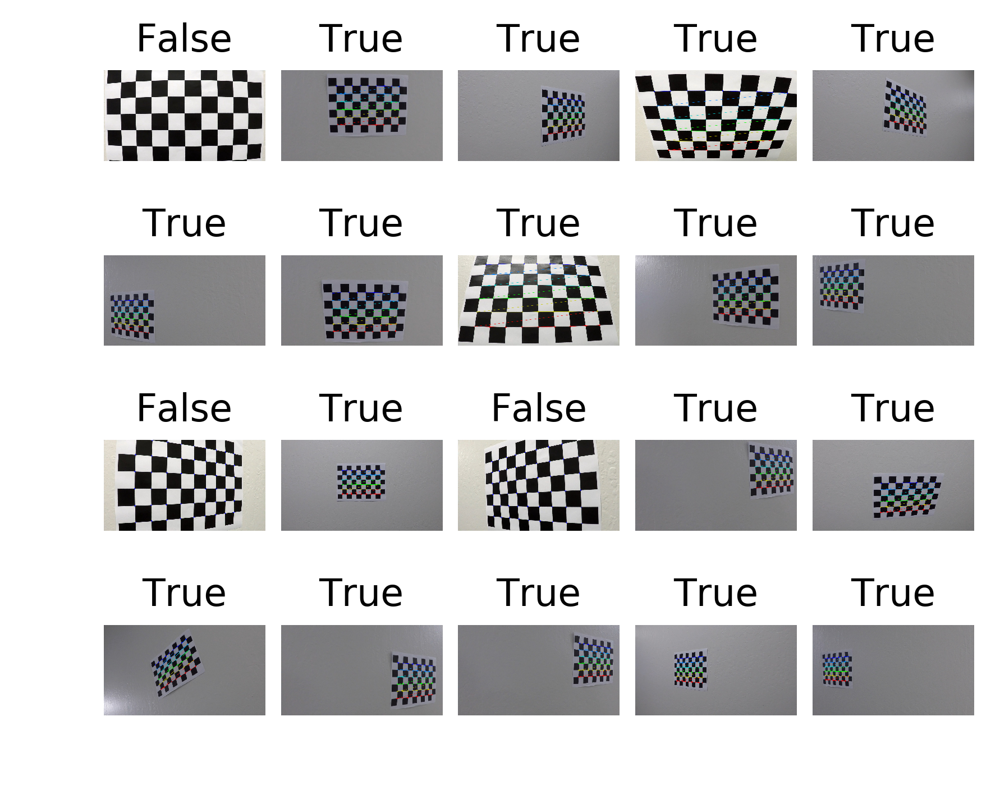

In [3]:
#####
# Finding image points and object points in gray scale images 
chessboard_img_gray=[]
chessboard_img_corners=[]
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
obj_points=[]
img_points=[]
corner_find_results=[]
#print(objp)
for i in range(num_chessboard_file):
    # convert to gray scale
    gray=cv2.cvtColor(chessboard_img[i], cv2.COLOR_RGB2GRAY)
    chessboard_img_gray.append(gray)
    
    # find corners 
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    corner_img = cv2.drawChessboardCorners(chessboard_img[i], (nx,ny), corners, ret)
    chessboard_img_corners.append(corner_img)
    corner_find_results.append(ret)
    
    # save img points & obj points
    if(ret==True):
        obj_points.append(objp)
        img_points.append(corners)

#####
# Visualizing chessboard images with corners 
print("Chessboard Images with Corners")
rows=4
cols=5
fig, ax = plt.subplots(rows, cols, figsize=(cols, rows), dpi=400)
fig.subplots_adjust(hspace = .5, wspace=.1)
for i in range(rows):
    for k in range(cols):
        ax[i][k].set_axis_off()
        if (i*cols+k)<len(chessboard_img_corners):
            ax[i][k].set_title(corner_find_results[i*cols+k])
            ax[i][k].imshow(chessboard_img_corners[i*cols+k])
plt.show()
plt.close()

#####
# Find out camera matrix and distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, chessboard_img_gray[0].shape[::-1], None, None)


## 2. Apply a distortion correction to raw images.

Chessboard Image Example


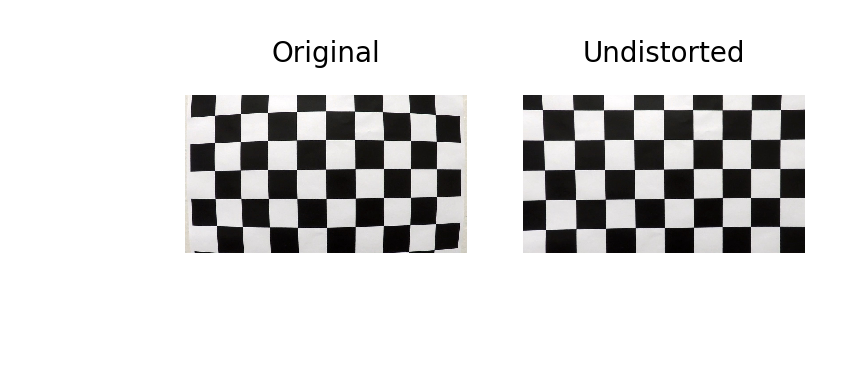

Test Image : test6.jpg


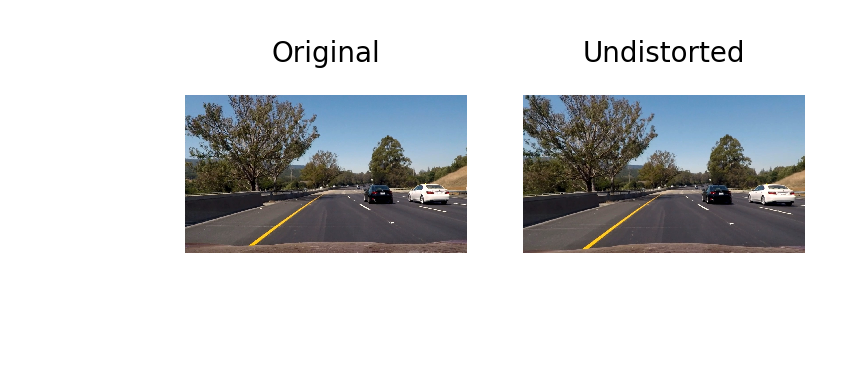

Test Image : test4.jpg


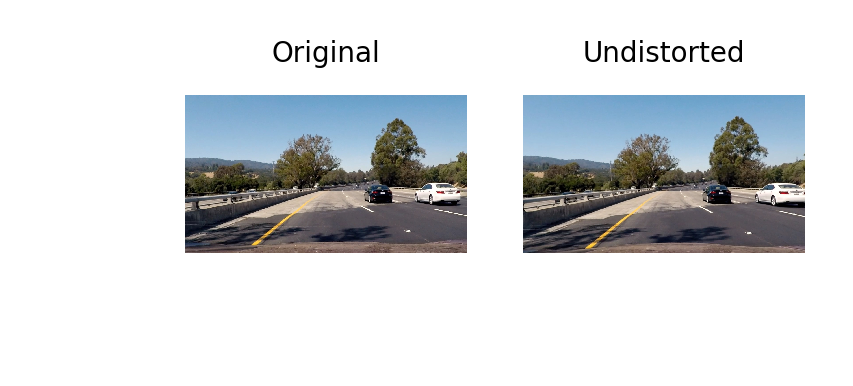

Test Image : test5.jpg


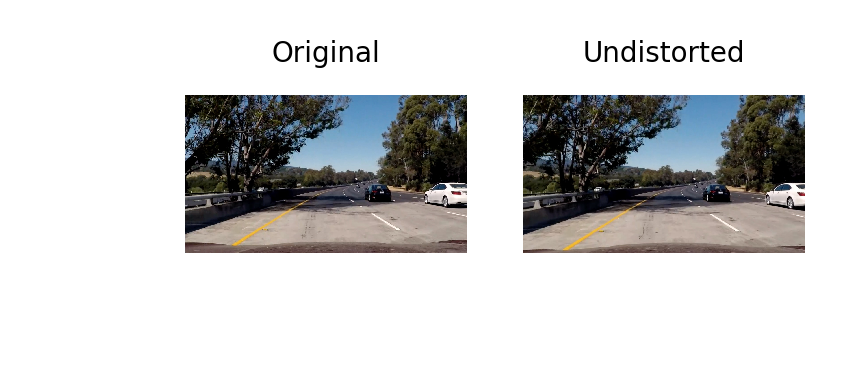

Test Image : test1.jpg


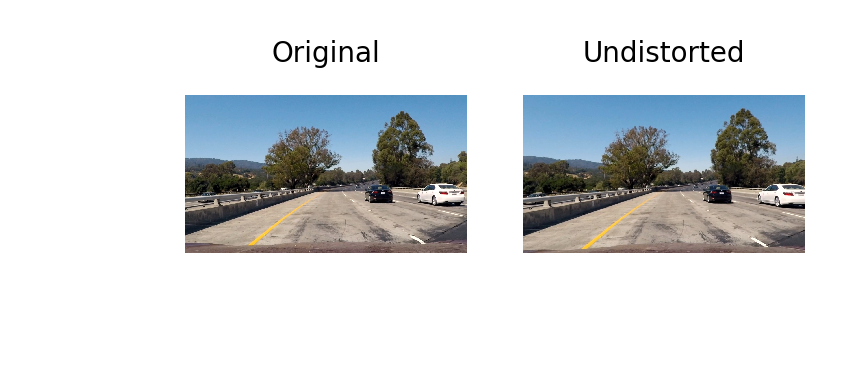

Test Image : straight_lines2.jpg


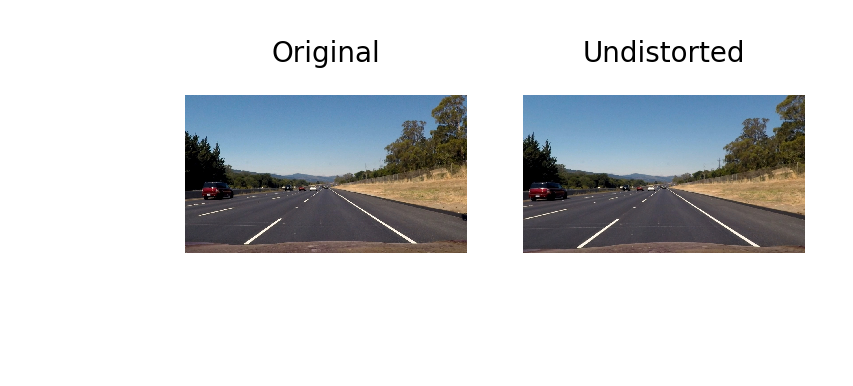

Test Image : straight_lines1.jpg


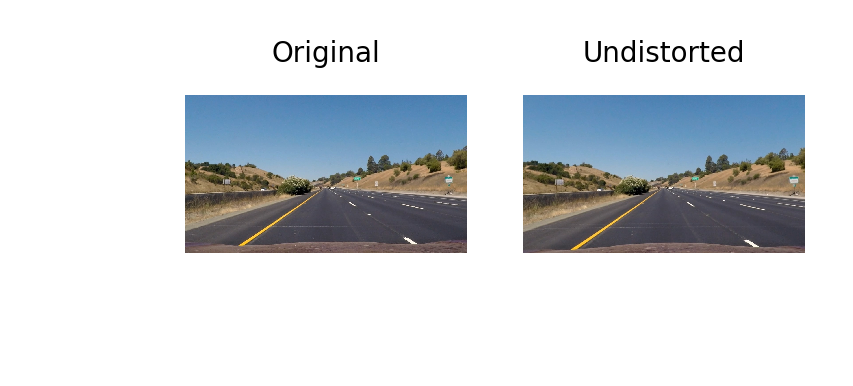

Test Image : test3.jpg


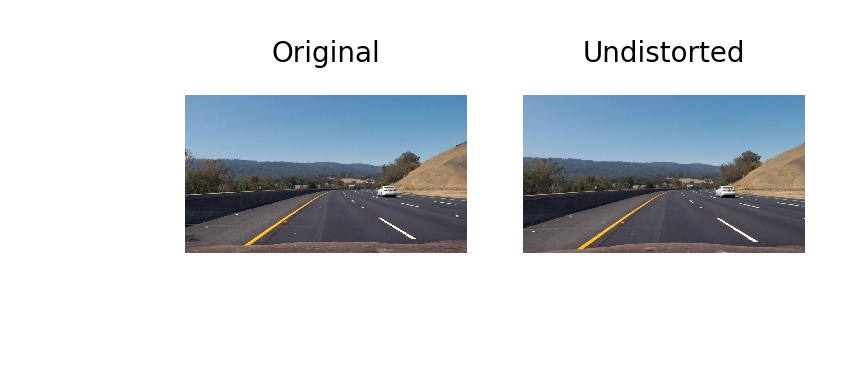

Test Image : test2.jpg


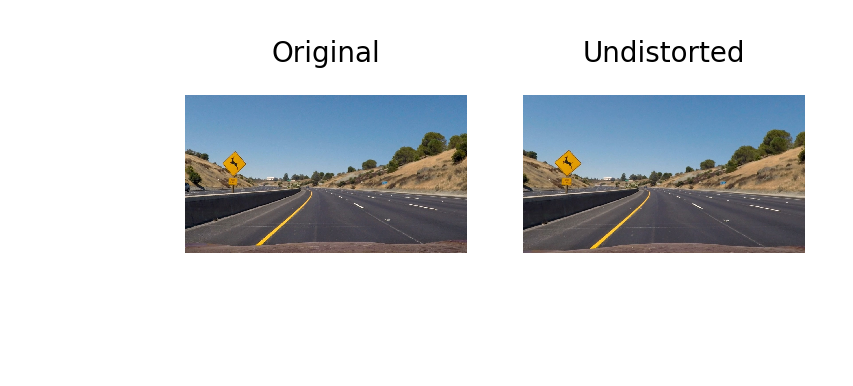

In [4]:
#####
# Read test images
test_file_list = glob.glob(os.path.join("./test_images", '*.jpg'))
num_test_file = len(test_file_list)
#print(test_file_list)
test_img=[]
for f in test_file_list:
    img = mpimg.imread(f)
    test_img.append(img)

for i in range(num_test_file):    
    test_file_list[i] = test_file_list[i].split('/')[-1]
    
#####
# Undistort images
def undistort_img(img, mtx=mtx, dist=dist, display=False):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if display==True:
        rows=1
        cols=2
        fig, ax = plt.subplots(rows, cols, figsize=(cols, rows), dpi=400)
        ax[0].set_axis_off()
        ax[0].set_title("Original", fontsize=5)
        ax[0].imshow(img)
        ax[1].set_axis_off()
        ax[1].set_title("Undistorted", fontsize=5)
        ax[1].imshow(undist)
        plt.show()
    return undist

# First, Try on a chessboard image
print("Chessboard Image Example")
undist = undistort_img(chessboard_img[0], display=True)

# Try on test images
for i in range(num_test_file):
    print("Test Image : {}".format(test_file_list[i]))
    undistort_img(test_img[i], display=True)
    


## 3. Perspective Transform

Region of Interest


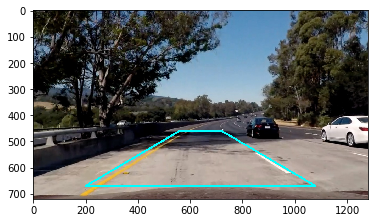

Warped Image


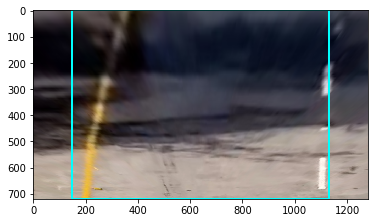

Warping


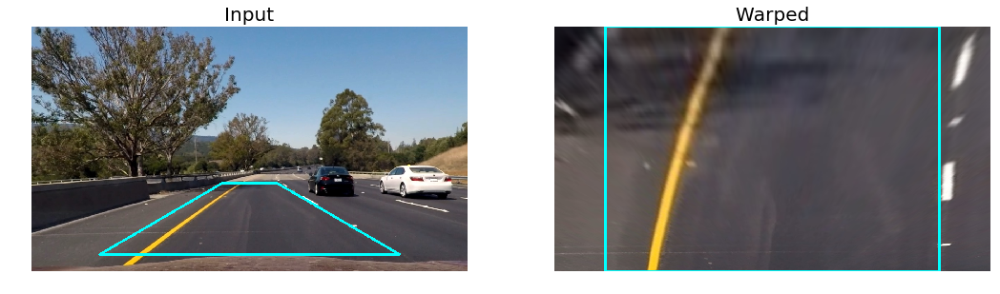

Warping


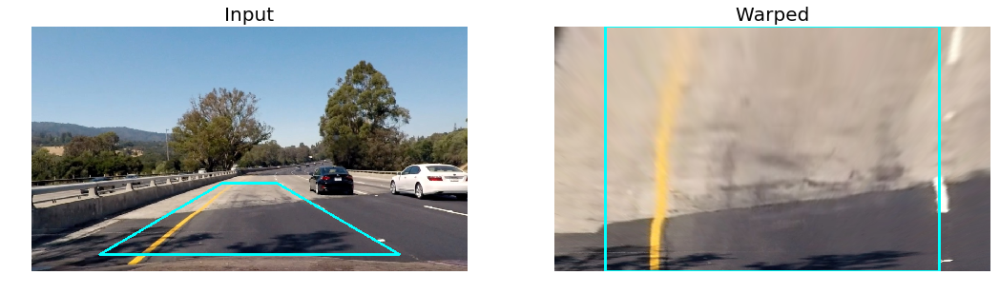

Warping


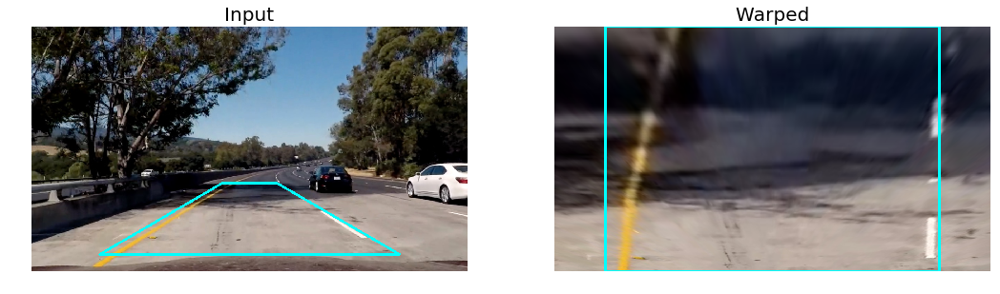

Warping


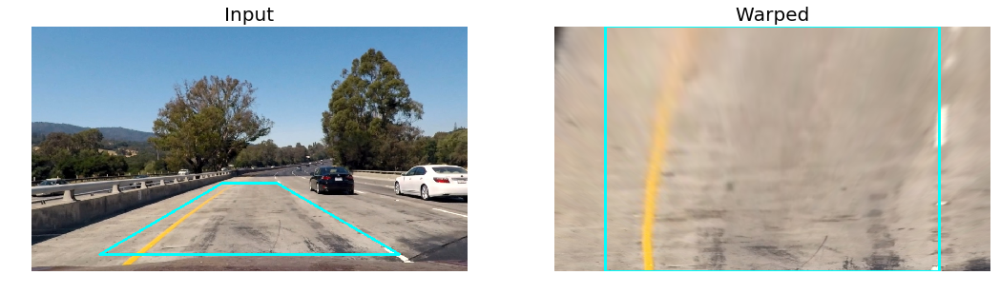

Warping


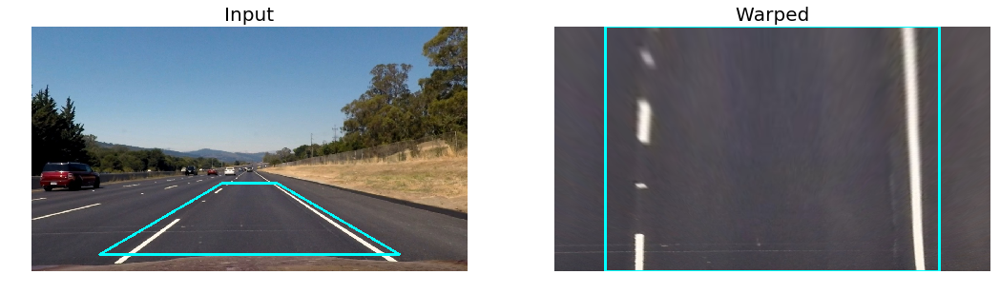

Warping


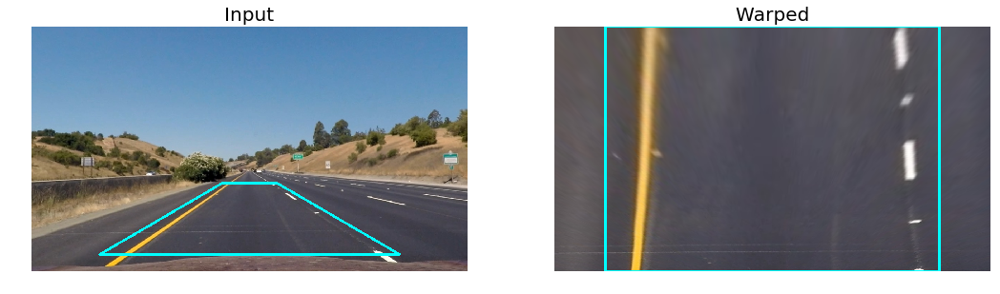

Warping


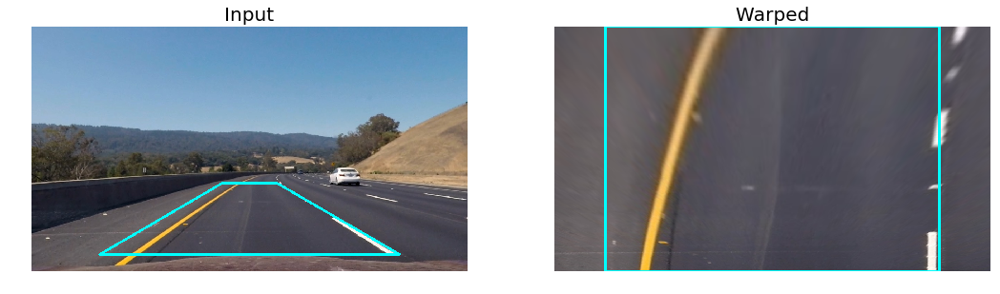

Warping


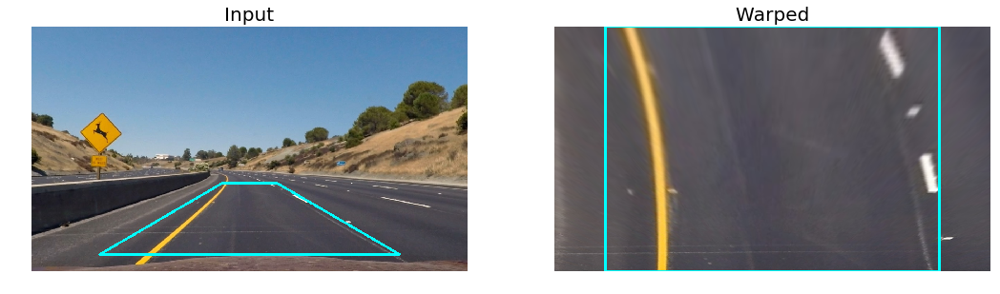

In [5]:
perspective_test_img = undistort_img(test_img[2])

#####
# Region of interest 
img_shape = perspective_test_img.shape
#print(img_shape)
w = img_shape[1] #1280
h = img_shape[0] #720
x_midpoint = int(w/2) #640
x_margin = 200
x_margin2 = x_margin+360
y_offset = int(h/2) +100
y_offset2 = 50

# 'src' where to crop
src = np.float32([(x_margin,h-y_offset2),(w-x_margin,h-y_offset2),(w-x_margin2,y_offset),(x_margin2,y_offset)])

#Visualize 'src'
pts_src = src.reshape((-1,1,2)).astype(np.int32)
roi = copy.deepcopy(perspective_test_img)
cv2.polylines(roi, [pts_src], True, (0,255,255), 5)
print("Region of Interest")
plt.imshow(roi)
plt.show()

# 'dst' where to warp
dst_offset = 150
dst = np.float32([(dst_offset,h-1), (w-dst_offset,h-1),   (w-dst_offset,0),  (dst_offset,0)])
pts_dst = dst.reshape((-1,1,2)).astype(np.int32)
#print(dst)

# Caculate perspective transform matrix, 'M', and its invers 'Minv'
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

#####
# Visualize Warped image 
img_size = perspective_test_img.shape[1::-1]
warped = cv2.warpPerspective(perspective_test_img, M, img_size, flags=cv2.INTER_LINEAR)
cv2.polylines(warped, [pts_dst], True, (0,255,255), 5)
print("Warped Image")
plt.imshow(warped)
plt.show()

#####
# Perspective transform warp function
def warp_img(img, M=M, display=False):
    img_size = img.shape[1::-1]
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    if display==True:
        img_temp = copy.deepcopy(img)
        cv2.polylines(img_temp, [pts_src], True, (0,255,255), 5)
        warped_temp = copy.deepcopy(warped)
        cv2.polylines(warped_temp, [pts_dst], True, (0,255,255), 5)
        
        print("Warping")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input", fontsize=20)
        ax[0].imshow(img_temp)
        ax[1].set_axis_off()
        ax[1].set_title("Warped", fontsize=20)
        ax[1].imshow(warped_temp)
        plt.show()
        
    return warped


#####
# Visulize all test images and their warped ones.
for img in test_img:
    warp_img(undistort_img(img), display=True)
    


## 4. Thresholded binary image

### 4.1. Visualize Color Transforms

Original Image


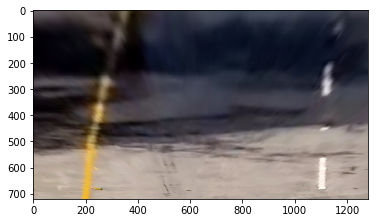

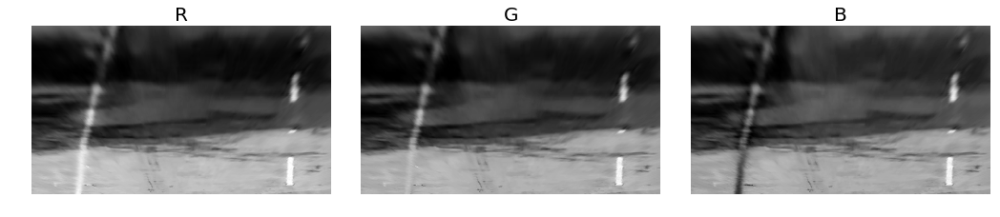

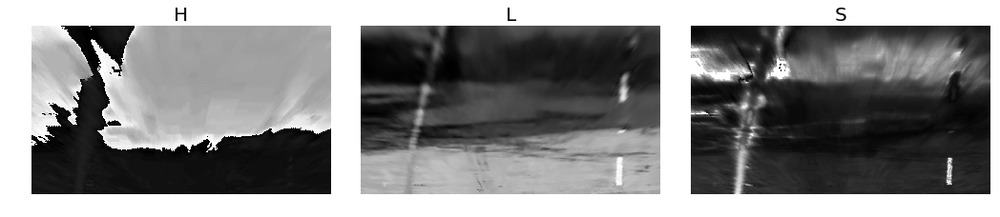

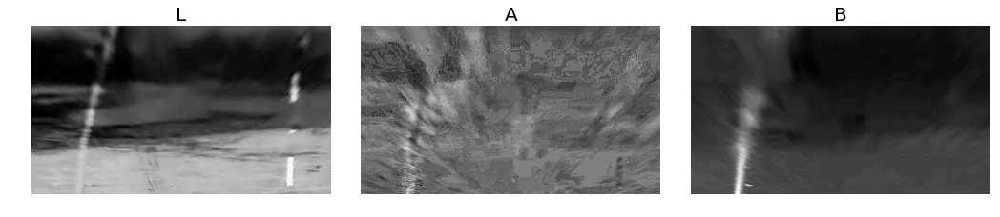

In [6]:
transform_img = warp_img(undistort_img(test_img[2])) #RGB
print("Original Image")
plt.imshow(transform_img)

#####
# RGB
RGB_R = transform_img[:,:,0]
RGB_G = transform_img[:,:,1]
RGB_B = transform_img[:,:,2]

rows=1
cols=3
fig, ax = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
fig.subplots_adjust(hspace = .2, wspace=.1)
ax[0].set_axis_off()
ax[0].set_title("R", fontsize=20)
ax[0].imshow(RGB_R, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("G", fontsize=20)
ax[1].imshow(RGB_G, cmap='gray')
ax[2].set_axis_off()
ax[2].set_title("B", fontsize=20)
ax[2].imshow(RGB_B, cmap='gray')
plt.show()

#####
# HLS
transform_img_HLS = cv2.cvtColor(transform_img, cv2.COLOR_RGB2HLS)
HLS_H = transform_img_HLS[:,:,0]
HLS_L = transform_img_HLS[:,:,1]
HLS_S = transform_img_HLS[:,:,2]

rows=1
cols=3
fig, ax = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
fig.subplots_adjust(hspace = .2, wspace=.1)
ax[0].set_axis_off()
ax[0].set_title("H", fontsize=20)
ax[0].imshow(HLS_H, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("L", fontsize=20)
ax[1].imshow(HLS_L, cmap='gray')
ax[2].set_axis_off()
ax[2].set_title("S", fontsize=20)
ax[2].imshow(HLS_S, cmap='gray')
plt.show()


#####
# LAB
transform_img_LAB = cv2.cvtColor(transform_img, cv2.COLOR_RGB2LAB)
LAB_L = transform_img_LAB[:,:,0]
LAB_A = transform_img_LAB[:,:,1]
LAB_B = transform_img_LAB[:,:,2]

rows=1
cols=3
fig, ax = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
fig.subplots_adjust(hspace = .2, wspace=.1)
ax[0].set_axis_off()
ax[0].set_title("L", fontsize=20)
ax[0].imshow(LAB_L, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("A", fontsize=20)
ax[1].imshow(LAB_A, cmap='gray')
ax[2].set_axis_off()
ax[2].set_title("B", fontsize=20)
ax[2].imshow(LAB_B, cmap='gray')
plt.show()


### 4.2. Color Thresholding
 As seeing each channel of the image, the combination of 'R' in RGB, 'S' in HLS and 'B' in LAB show great difference of lanes.




 Input


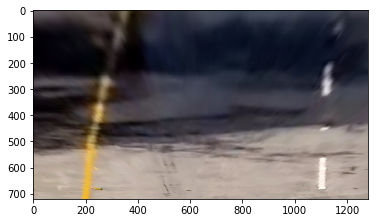

Color thresholding


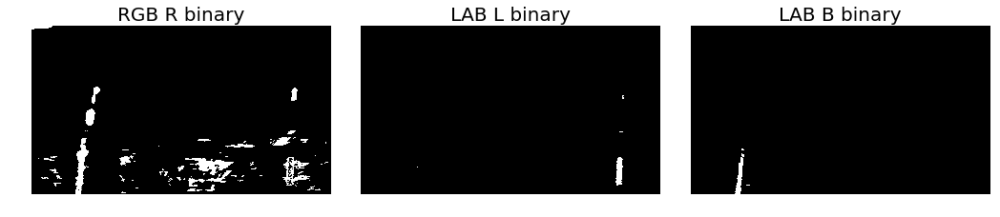

Combined output


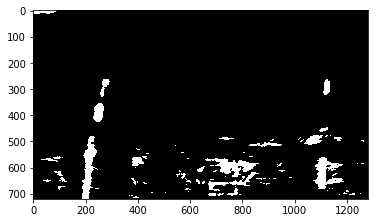

Test for all test images



 Input


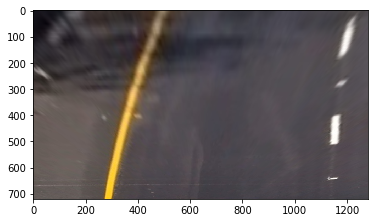

Color thresholding


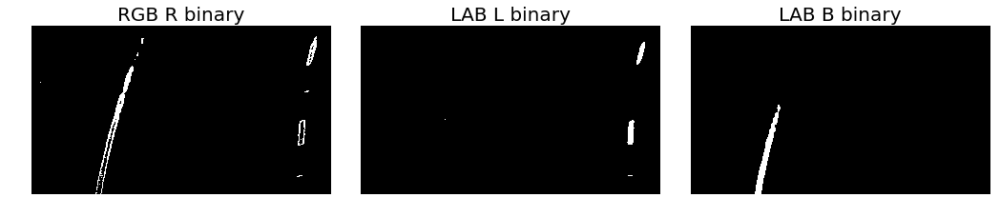

Combined output


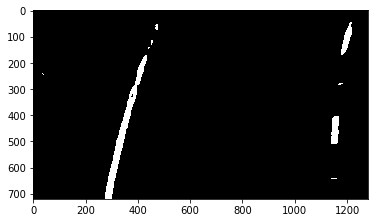




 Input


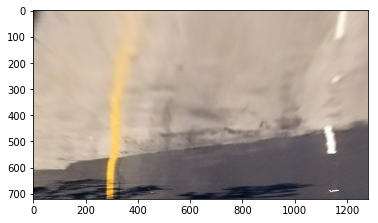

Color thresholding


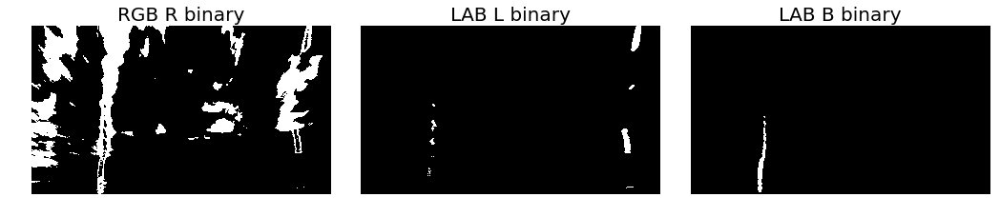

Combined output


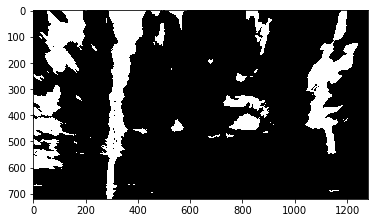




 Input


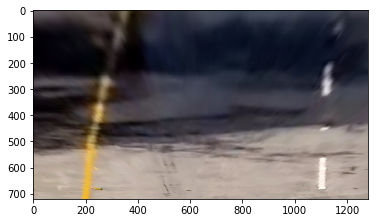

Color thresholding


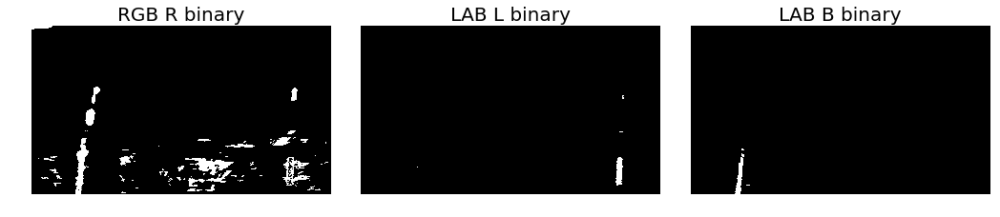

Combined output


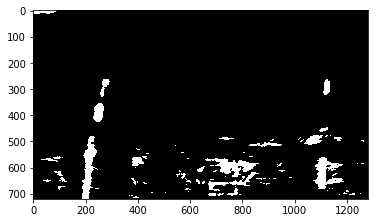




 Input


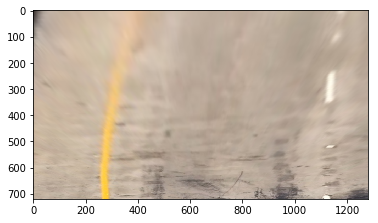

Color thresholding


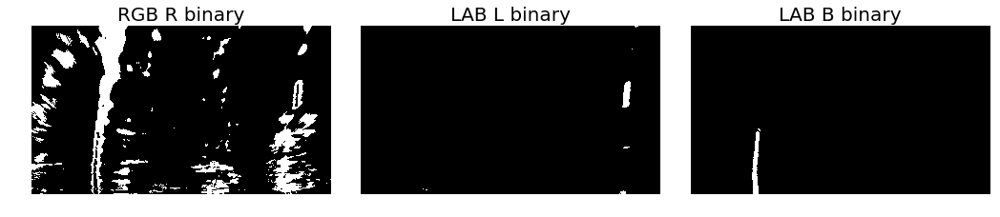

Combined output


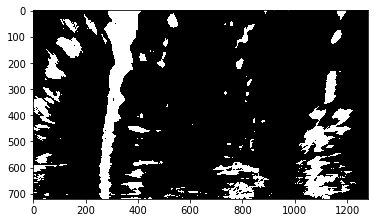




 Input


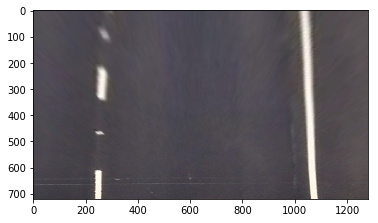

Color thresholding


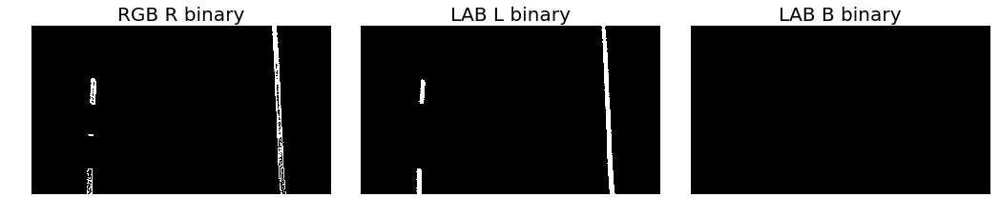

Combined output


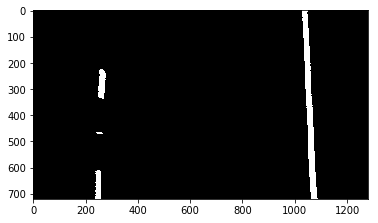




 Input


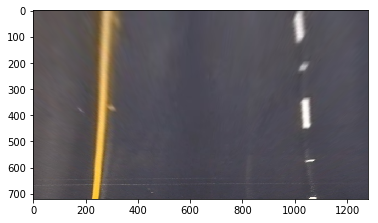

Color thresholding


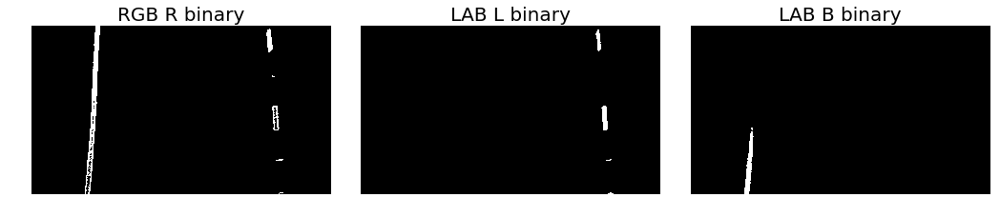

Combined output


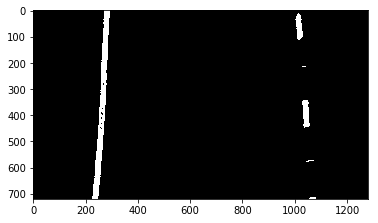




 Input


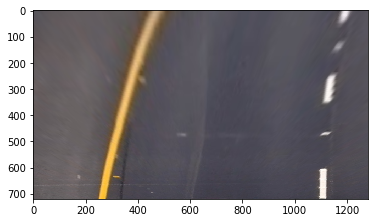

Color thresholding


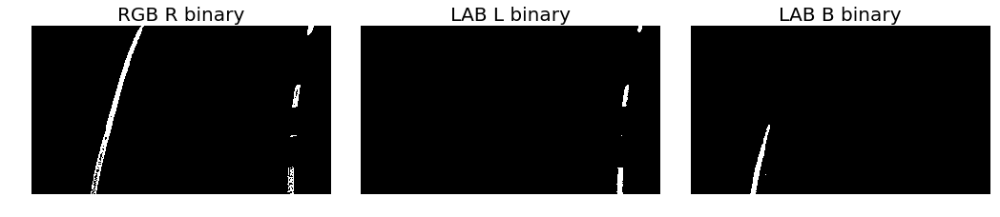

Combined output


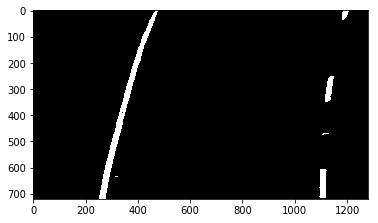




 Input


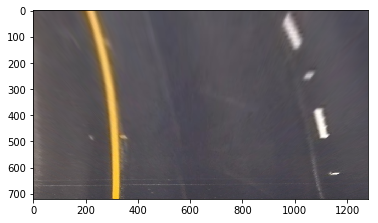

Color thresholding


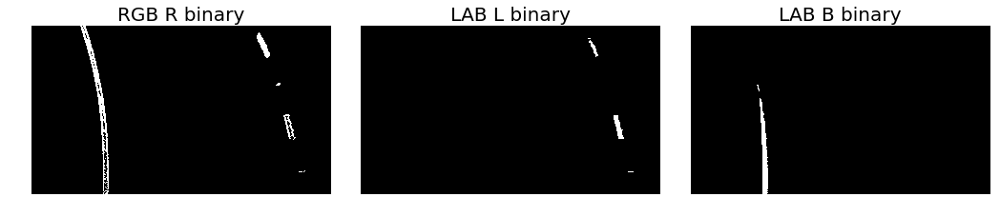

Combined output


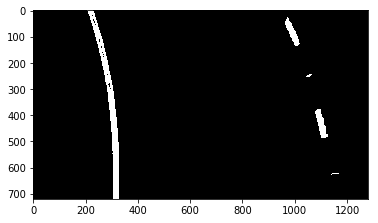

In [7]:
#####
# color thresholding function

#def color_thresholding(rgb_img, thres_r=(205, 255), thres_b=(140,255), thres_l=(200, 255), display=False):
def color_thresholding(rgb_img, thres_r=(200, 250), thres_b=(180,255), thres_l=(220, 255), display=False):
      
    r = rgb_img[:,:,0]
    lab_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2LAB)
    l = lab_img[:,:,0]
    b = lab_img[:,:,2]
    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    r = clahe.apply(r)
     
    
    r_binary = np.zeros_like(r)
    r_binary[(r > thres_r[0]) & (r <= thres_r[1])] = 1
    l_binary = np.zeros_like(l)
    l_binary[(l > thres_l[0]) & (l <= thres_l[1])] = 1
    b_binary = np.zeros_like(b)
    b_binary[(b > thres_b[0]) & (b <= thres_b[1])] = 1
    
    if(display==True):
        print("\n\n\n Input")
        plt.imshow(rgb_img)
        plt.show()
        print("Color thresholding")
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        fig.subplots_adjust(hspace = .2, wspace=.1)
        ax[0].set_axis_off()
        ax[0].set_title("RGB R binary", fontsize=20)
        ax[0].imshow(r_binary, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("LAB L binary", fontsize=20)
        ax[1].imshow(l_binary, cmap='gray')
        ax[2].set_axis_off()
        ax[2].set_title("LAB B binary", fontsize=20)
        ax[2].imshow(b_binary, cmap='gray')
        plt.show()
    
#     combined = r_binary
#     combined[(l_binary==1)|(b_binary==1)]=1
    combined=np.zeros_like(r_binary)
    combined[(r_binary==1)|(l_binary==1)|(b_binary==1)]=1
    if(display==True):
        print("Combined output")
        plt.imshow(combined, cmap='gray')
        plt.show()
    return combined
combined_color = color_thresholding(transform_img, display=True)

print("Test for all test images")
for img in test_img:
    __img = warp_img(undistort_img(img))
    combined_color = color_thresholding(__img, display=True)
                   
                   

### 4.3. Applying Sobel operator

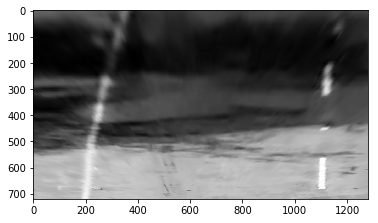

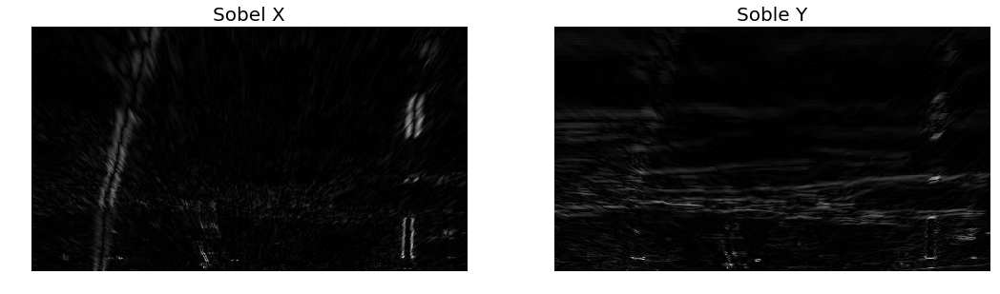

In [8]:
sobel_img = transform_img  # used one in color transform
sobel_img_gray = cv2.cvtColor(sobel_img, cv2.COLOR_RGB2GRAY)
sobel_img_gray = sobel_img[:,:,0]
plt.imshow(sobel_img_gray, cmap='gray')

#####
# Apply Sobel filter
sobelx = cv2.Sobel(sobel_img_gray, cv2.CV_64F, 1, 0, ksize=5)
sobelx = np.absolute(sobelx)
sobelx = np.uint8(255*sobelx/np.max(sobelx))
sobely = cv2.Sobel(sobel_img_gray, cv2.CV_64F, 0, 1, ksize=5)
sobely = np.absolute(sobely)
sobely = np.uint8(255*sobely/np.max(sobely))

#####
# Visualize filtered image
fig, ax = plt.subplots(1, 2, figsize=(18, 6))
ax[0].set_axis_off()
ax[0].set_title("Sobel X", fontsize=20)
ax[0].imshow(sobelx, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("Soble Y", fontsize=20)
ax[1].imshow(sobely, cmap='gray')
plt.show()


Absolute sobel for 'gray'
Sobel Absolute Threshold


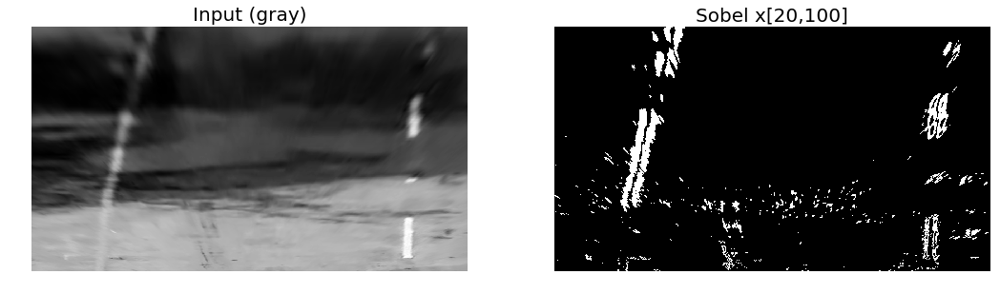

Absolute sobel for 'R'
Sobel Absolute Threshold


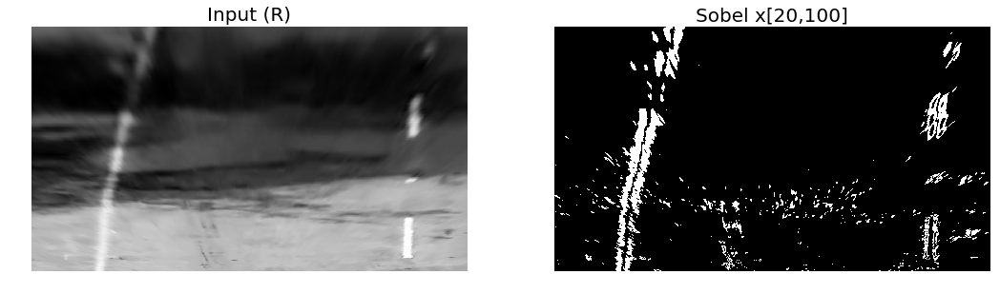

Absolute sobel for 'S'
Sobel Absolute Threshold


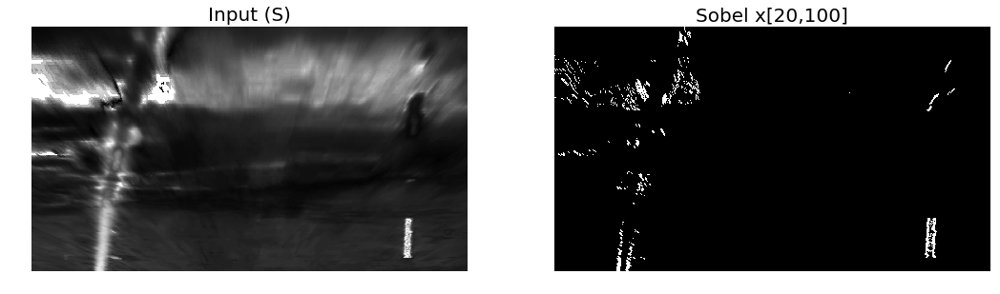

In [9]:

#####
# Absolute Soble Threshold

# format : try Sobel to different color format
#          'gray' : gray
#          'S'    : S of HLS
#          'R'    : R of RGB

def sobel_abs_thresh(img, format='S', orient='x', thresh_min=20, thresh_max=100, display=False):
    if format=='S':
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2] # HLS S
    elif format=='R':
        sobel = img[:,:,0]
    else:
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    dir=0
    if orient=='y':
        dir=1
    _sobel = cv2.Sobel(sobel, cv2.CV_64F, (not dir), dir, ksize=5)
    abs_sobel = np.absolute(_sobel)
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    if display==True:
        print("Sobel Absolute Threshold")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input ({})".format(format), fontsize=20)
        ax[0].imshow(sobel, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Sobel "+orient+"[{},{}]".format(thresh_min, thresh_max), fontsize=20)
        ax[1].imshow(sbinary, cmap='gray')
        plt.show()

    return sbinary

print("Absolute sobel for 'gray'")
sbinary_x = sobel_abs_thresh(sobel_img, format='gray', orient='x', display=True)
#sbinary_y = sobel_abs_thresh(sobel_img, format='gray', orient='y', display=True)

print("Absolute sobel for 'R'")
sbinary_x = sobel_abs_thresh(sobel_img, format='R', orient='x', display=True)
#sbinary_y = sobel_abs_thresh(sobel_img, format='R', orient='y', display=True)

print("Absolute sobel for 'S'")
sbinary_x = sobel_abs_thresh(sobel_img, format='S', orient='x', display=True)
#sbinary_y = sobel_abs_thresh(sobel_img, format='S', orient='y', display=True)




Magnitude sobel for 'gray'
Sobel Magnitude Threshold


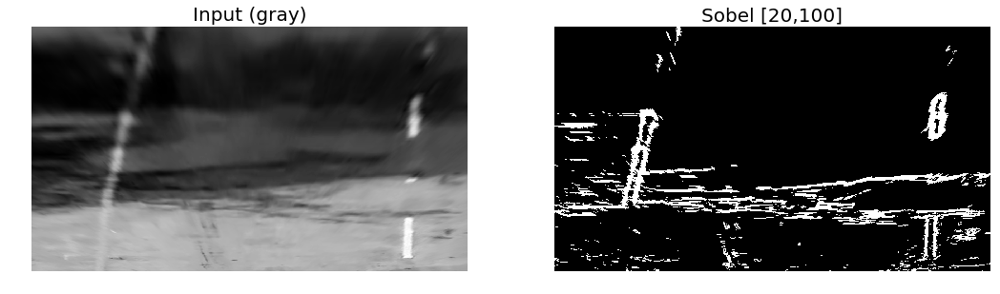

Magnitude sobel for 'R'
Sobel Magnitude Threshold


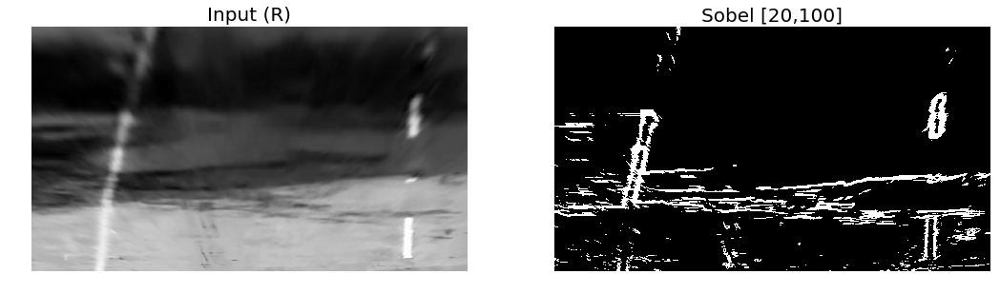

Magnitude sobel for 'S'
Sobel Magnitude Threshold


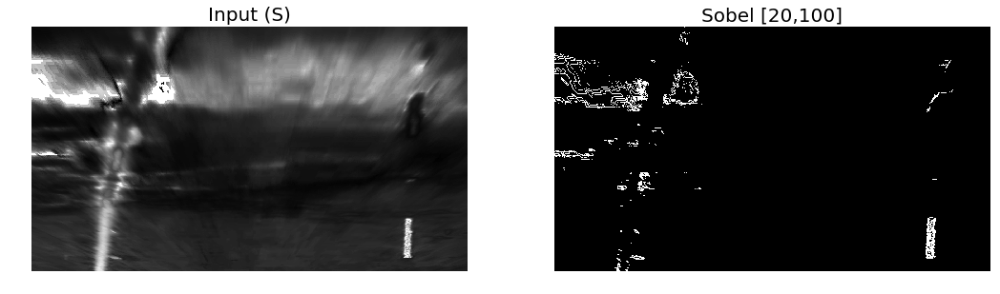

In [10]:
#####
# Sobel Magnitude Threshold


def sobel_mag_thresh(img, format='S', thresh_min=20, thresh_max=100, display=False):
    if format=='S':
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2] # HLS S
    elif format=='R':
        sobel = img[:,:,0]
    else:
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(sobel, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(sobel, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculate the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag/np.max(mag))
    
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    if display==True:
        print("Sobel Magnitude Threshold")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input ({})".format(format), fontsize=20)
        ax[0].imshow(sobel, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Sobel [{},{}]".format(thresh_min, thresh_max), fontsize=20)
        ax[1].imshow(sbinary, cmap='gray')
        plt.show()

    return sbinary


print("Magnitude sobel for 'gray'")
sbinary_mag = sobel_mag_thresh(sobel_img, format='gray', display=True)

print("Magnitude sobel for 'R'")
sbinary_mag = sobel_mag_thresh(sobel_img, format='R', display=True)

print("Magnitude sobel for 'S'")
sbinary_mag = sobel_mag_thresh(sobel_img, format='S', display=True)



Gradient sobel for 'gray'
Sobel Gradient Threshold


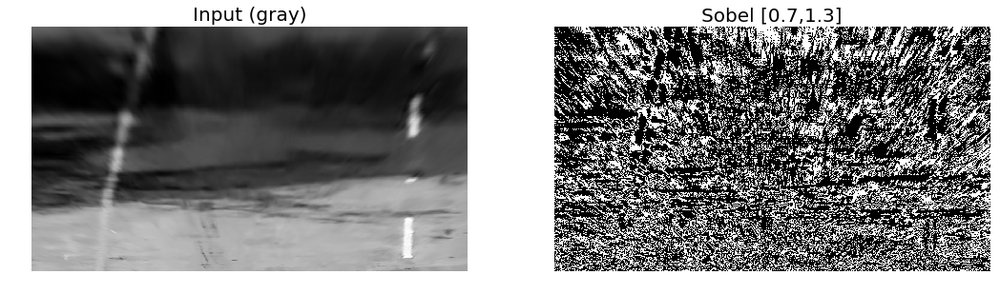

Gradient sobel for 'R'
Sobel Gradient Threshold


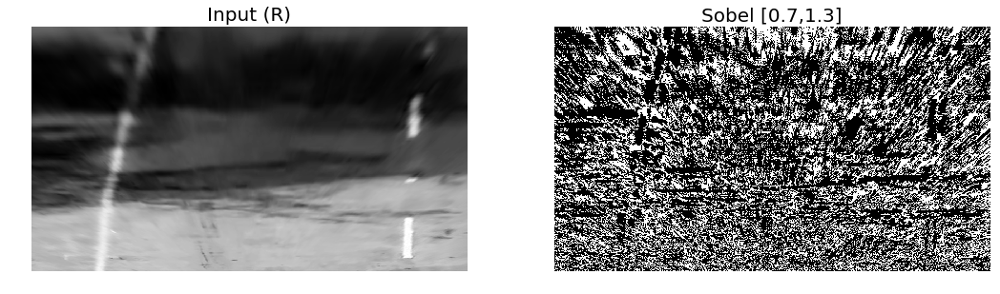

Gradient sobel for 'S'
Sobel Gradient Threshold


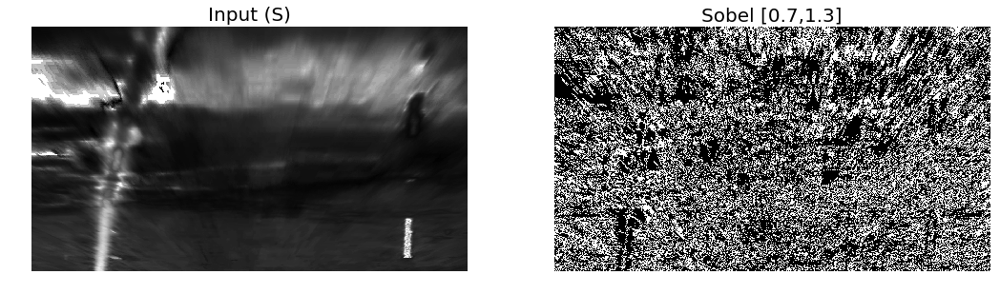

In [11]:
#####
# Sobel Gradient(Direction) Threshold


def sobel_grad_thresh(img, format='S', thresh_min=0.7, thresh_max=1.3, display=False):
    if format=='S':
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2] # HLS S
    elif format=='R':
        sobel = img[:,:,0]
    else:
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(sobel, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(sobel, cv2.CV_64F, 0, 1, ksize=3)

    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad = np.arctan2(abs_sobely, abs_sobelx)
        
    sbinary = np.zeros_like(grad)
    sbinary[(grad >= thresh_min) & (grad <= thresh_max)] = 1
    
    if display==True:
        print("Sobel Gradient Threshold")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input ({})".format(format), fontsize=20)
        ax[0].imshow(sobel, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Sobel [{},{}]".format(thresh_min, thresh_max), fontsize=20)
        ax[1].imshow(sbinary, cmap='gray')
        plt.show()

    return sbinary


print("Gradient sobel for 'gray'")
sbinary_grad = sobel_grad_thresh(sobel_img, format='gray', display=True)

print("Gradient sobel for 'R'")
sbinary_grad = sobel_grad_thresh(sobel_img, format='R', display=True)

print("Gradient sobel for 'S'")
sbinary_grad = sobel_grad_thresh(sobel_img, format='S', display=True)

### 4.4. Combine thresholding techniques

test6.jpg
Combined binary


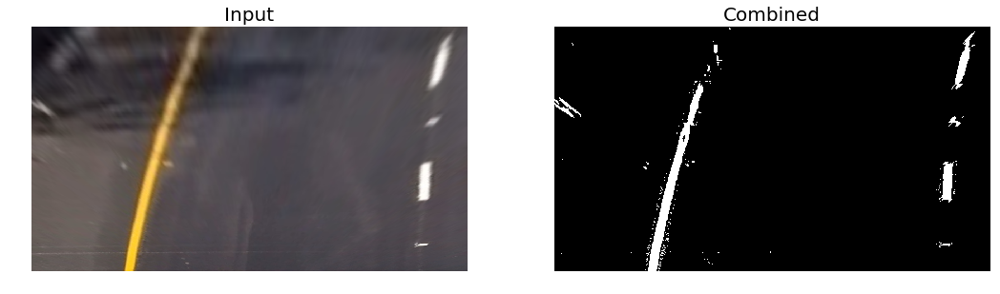

test4.jpg
Combined binary


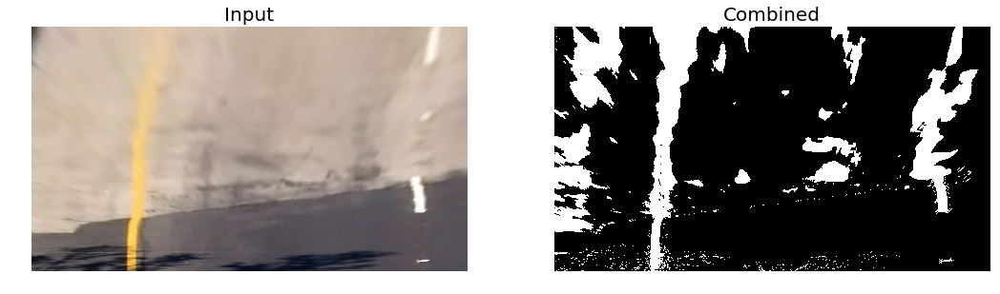

test5.jpg
Combined binary


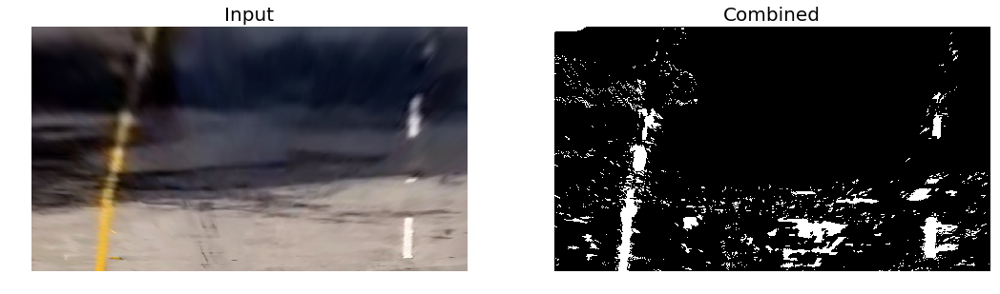

test1.jpg
Combined binary


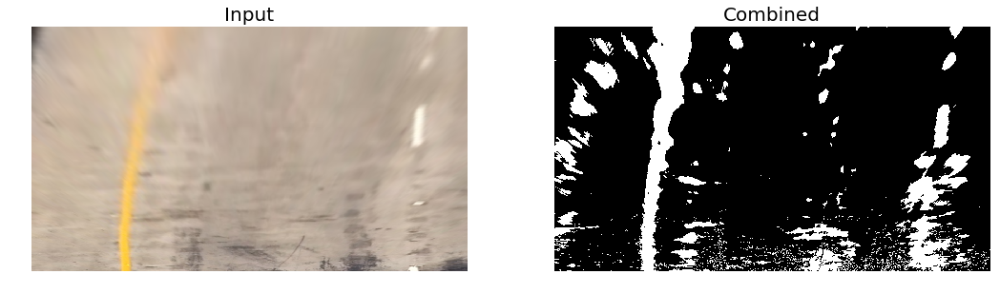

straight_lines2.jpg
Combined binary


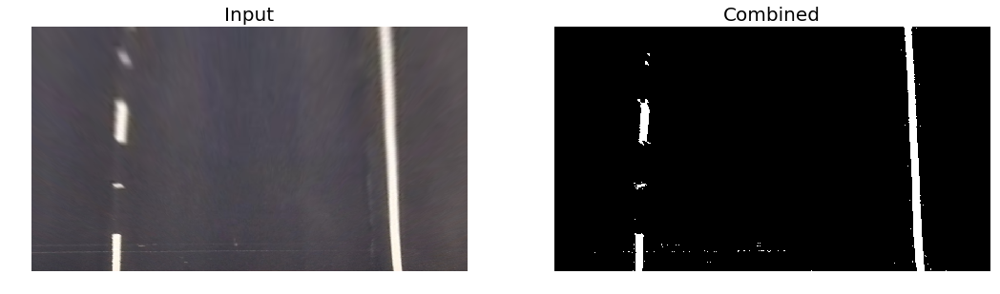

straight_lines1.jpg
Combined binary


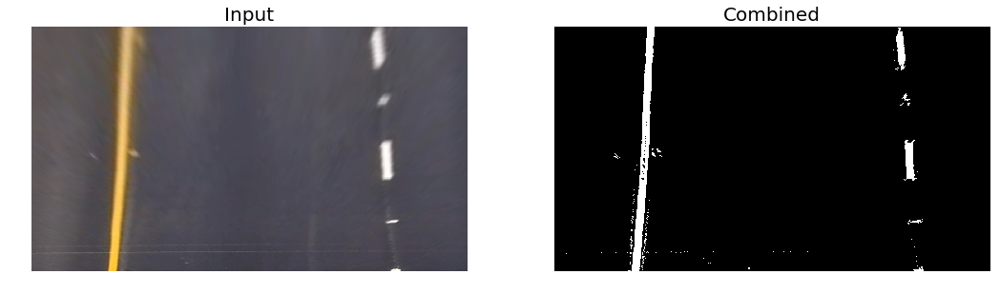

test3.jpg
Combined binary


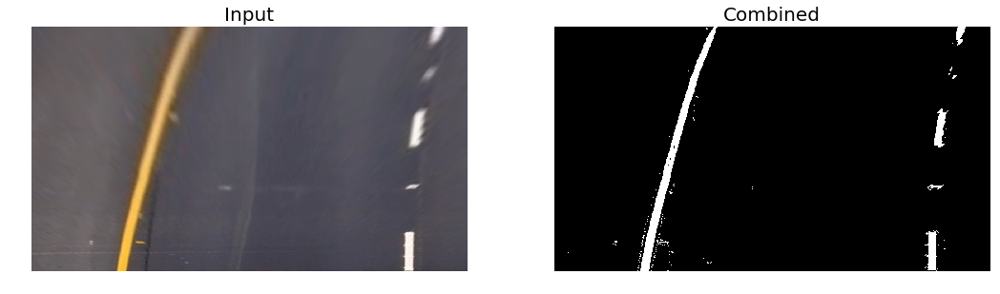

test2.jpg
Combined binary


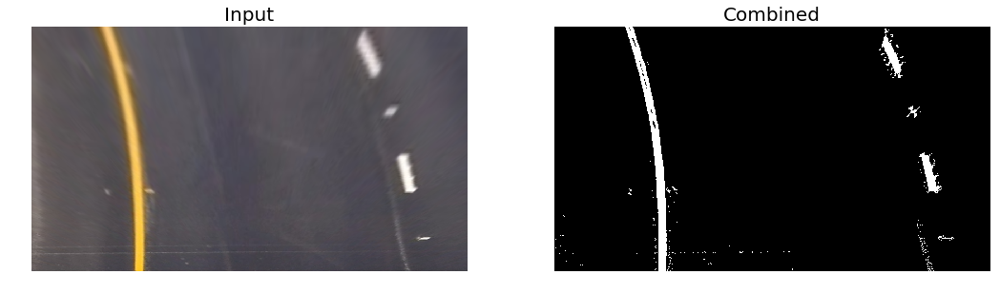

In [12]:
#####
# Combining thresholding techinques

def combined_thresholding(img, display=False):
    combined_color = color_thresholding(img)
    sbinary_x_abs_gray = sobel_abs_thresh(img, format='gray', orient='x')
    sbinary_x_abs_R = sobel_abs_thresh(img, format='R', orient='x')
    sbinary_x_abs_S = sobel_abs_thresh(img, format='S', orient='x')
    sbinary_mag_gray = sobel_mag_thresh(img, format='gray')
    sbinary_mag_R = sobel_mag_thresh(img, format='R')
    sbinary_mag_S = sobel_mag_thresh(img, format='S')
    sbinary_grad_gray = sobel_grad_thresh(img, format='gray')
    sbinary_grad_R = sobel_grad_thresh(img, format='R')
    sbinary_grad_S = sobel_grad_thresh(img, format='S')
    combined_sobel = np.zeros_like(sbinary_x_abs_gray)
#     combined_sobel[(((sbinary_x_abs_gray==1)|(sbinary_x_abs_R==1))\
#                     | ((sbinary_mag_R==1)|(sbinary_mag_S==1)) )\
#                     & ((sbinary_grad_R==1)&(sbinary_grad_R==1)) \
#                   ]=1
    combined_sobel[(((sbinary_x_abs_gray==1)|(sbinary_x_abs_R==1))\
                    | ((sbinary_mag_R==1)|(sbinary_mag_S==1)) )\
                   & ((sbinary_grad_R==1)|(sbinary_grad_R==1)) \
                    ]=1
    
    combined = combined_color | combined_sobel
    if display==True:
        print("Combined binary")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input", fontsize=20)
        ax[0].imshow(img)
        ax[1].set_axis_off()
        ax[1].set_title("Combined", fontsize=20)
        ax[1].imshow(combined, cmap='gray')
        plt.show()
        '''
        print("Combined binary")
        plt.imshow(img)
        plt.show()
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("combined_color".format(format), fontsize=20)
        ax[0].imshow(combined_color, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("combined_sobel", fontsize=20)
        ax[1].imshow(combined_sobel, cmap='gray')
        plt.show()
        print("Combined final")
        plt.imshow(combined, cmap='gray')
        plt.show()
        '''
    return combined


for i in range(num_test_file):
    img = test_img[i]
    print(test_file_list[i])
    combined = combined_thresholding(warp_img(undistort_img(img)), display=True)
    



## 5. Finding lane lines

### 5.1. Histogram

test6.jpg


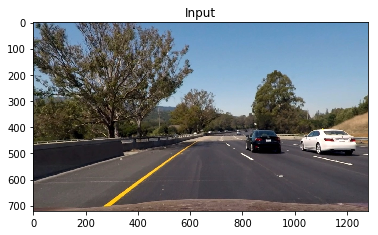

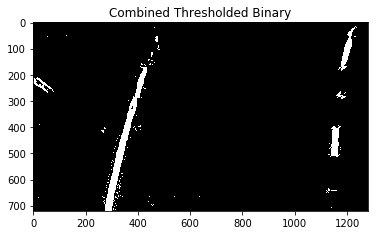

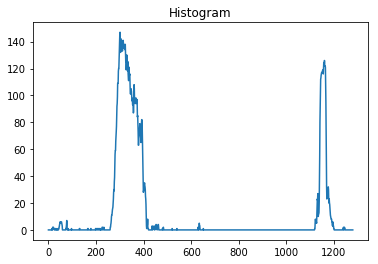

test4.jpg


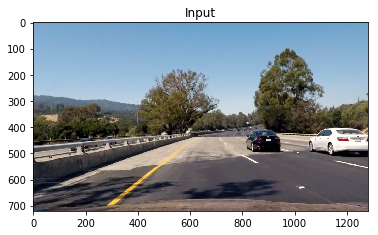

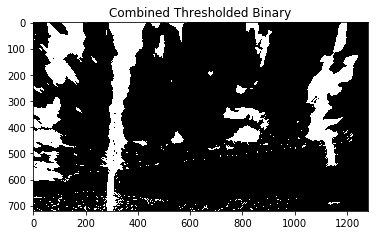

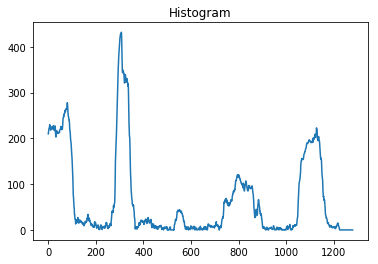

test5.jpg


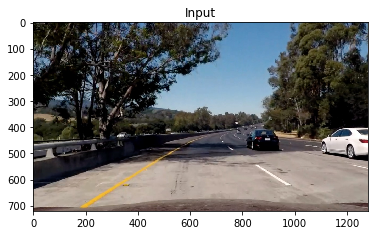

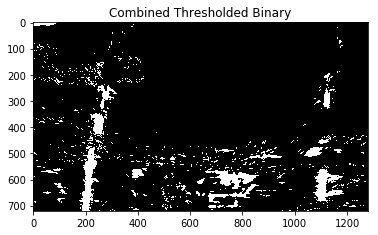

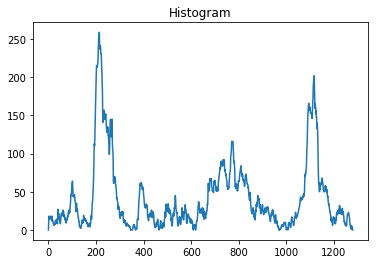

test1.jpg


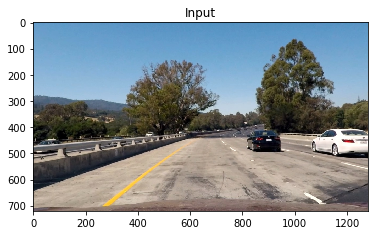

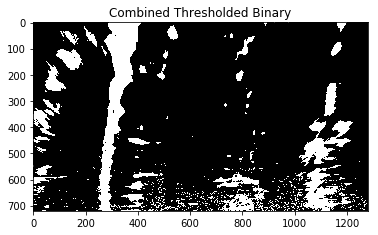

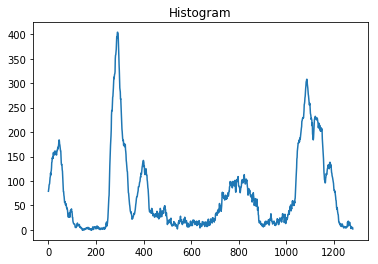

straight_lines2.jpg


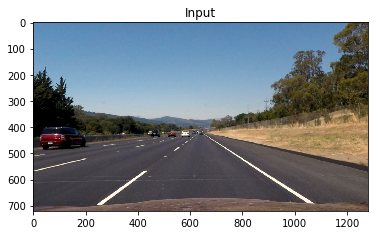

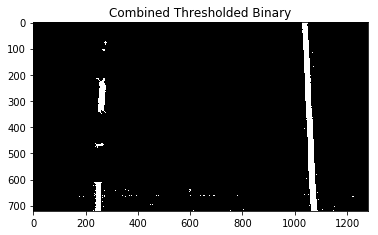

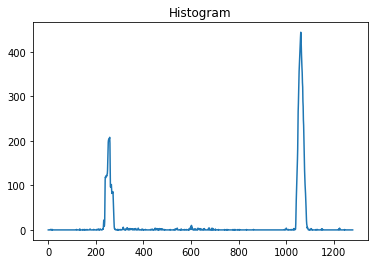

straight_lines1.jpg


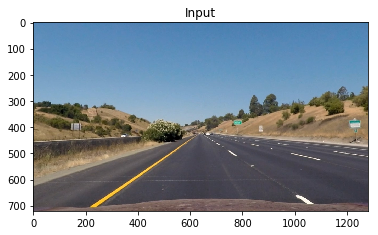

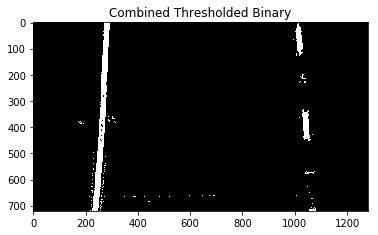

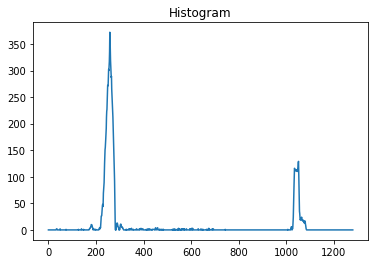

test3.jpg


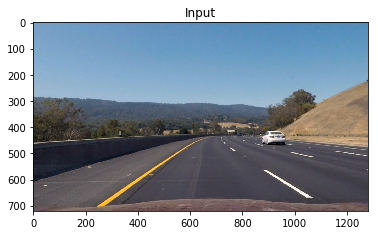

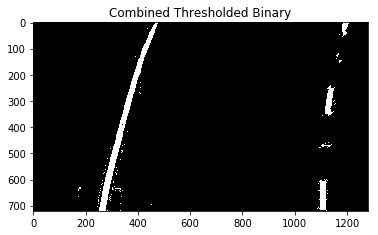

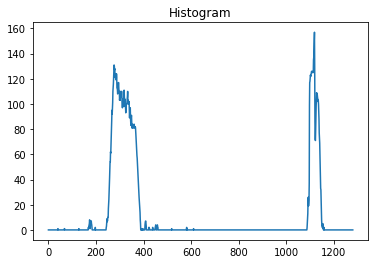

test2.jpg


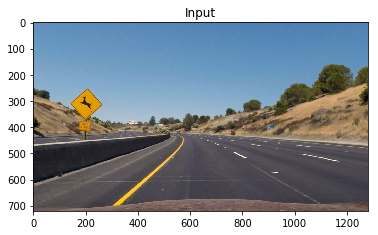

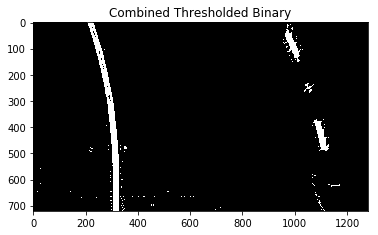

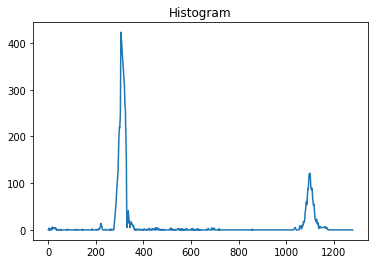

In [13]:
#####
# higtogram test

def histogram_test(img, display=False):
    undist = undistort_img(img)
    warped = warp_img(undist)
    combined = combined_thresholding(warped)
    
    # Histogram area is adjusted upwards in amount of 100 pixels.
    histogram = np.sum(combined[(combined.shape[0]//2)-100:,:], axis=0)

    if display==True:
        
        plt.title("Input")
        plt.imshow(undist)
        plt.show()
    
        plt.title("Combined Thresholded Binary")
        plt.imshow(combined, cmap='gray')
        plt.show()
    
        plt.title("Histogram")
        plt.plot(histogram)
        plt.show()
    
    return combined

# find_lane_test_img = test_img[2]
# undist = undistort_img(find_lane_test_img, display=True)
# combined = combined_thresholding(undist, display=True)
# warped = warp_img(combined, display=True)


#####
# Visulize all test images and their warped ones.


for i in range(num_test_file):
    img = test_img[i]
    print(test_file_list[i])
    histogram_test(img, display=True)
    

### 5.2. Fit lanes with Sliding Window method

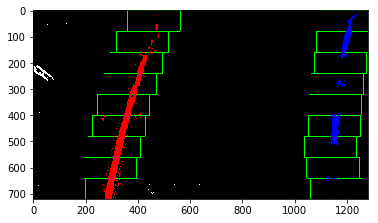

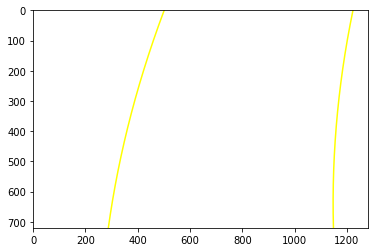

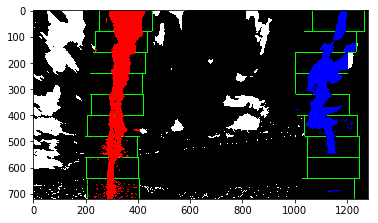

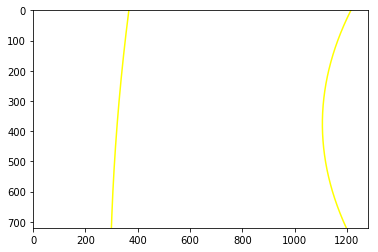

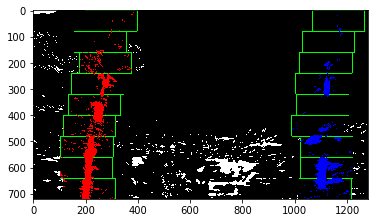

...

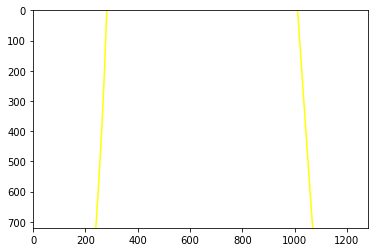

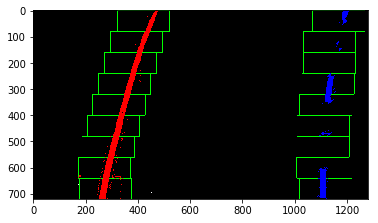

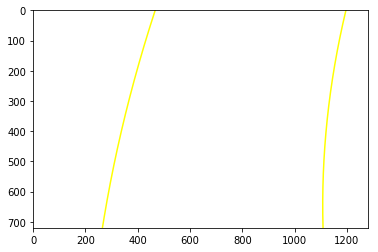

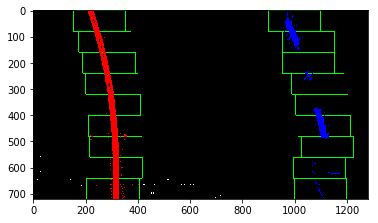

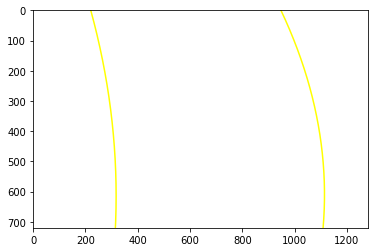

In [14]:
#####
# Fit lanes into 2nd order lines with Sliding Window method

def fit_poly_sliding_window(binary_warped, display=False):

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    #histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    histogram = np.sum(binary_warped[(binary_warped.shape[0]//2) - 100:,:], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

  
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    if display==True:
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        out_img = out_img.astype(np.uint8)
        plt.imshow(out_img)
        plt.show()
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
    return left_fitx, right_fitx, ploty, left_fit, right_fit, leftx_base, rightx_base

for img in test_img:
    undist = undistort_img(img)
    warped = warp_img(undist)
    binary_warped = combined_thresholding(warped).astype(np.int32)
    fit_poly_sliding_window(binary_warped, display=True)


### 5.3. Radius of Curverture  and lateral offset of camera

In [15]:
#####
# Measuring Radius of Curverture 


# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def radius_of_curverture(left_fitx, right_fitx, ploty, left_fit, right_fit, display=False):

    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    if display==True:
        print(left_curverad, 'm', right_curverad, 'm')
        
    return left_curverad, right_curverad
  
    
def lateral_offset(leftx_base, rightx_base, display=False):
    #print(leftx_base, rightx_base)
    center = (leftx_base+rightx_base)/2.
    offset = (center-639.5)*xm_per_pix
    if display==True:
        print(offset)
    return offset
    
for img in test_img:
    undist = undistort_img(img)
    warped = warp_img(undist)
    binary_warped = combined_thresholding(warped).astype(np.int32)
    left_fitx, right_fitx, ploty, left_fit, right_fit, leftx_base, rightx_base \
        = fit_poly_sliding_window(binary_warped)
    radius_of_curverture(left_fitx, right_fitx, ploty, left_fit, right_fit, display=True)
    lateral_offset(leftx_base, rightx_base, display=True)

866.70222725168 m 878.3115931625119 m
0.48100000000000004
2172.037386664864 m 214.42420924926128 m
0.40964285714285714
1278.815766955734 m 324.09733606418564 m
0.1347857142857143
1577.9995183376402 m 2509.4076007118506 m
0.2563571428571429
5345.46530235334 m 61326.66513408105 m
0.10571428571428572
5583.4241340667695 m 100857.24340233118 m
0.07928571428571429
1219.7332521023504 m 771.0646414688518 m
0.30392857142857144
639.8977536923347 m 367.67815462535 m
0.32771428571428574


## 6. Pipeline

0.48100000000000004


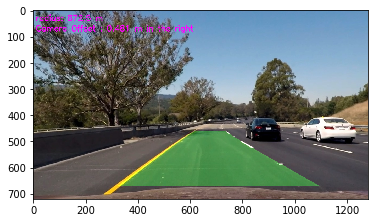

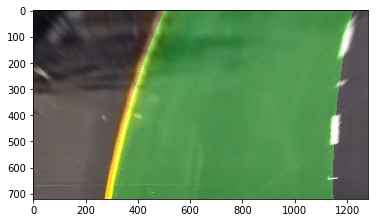

./output_images/test6.jpg
0.40964285714285714


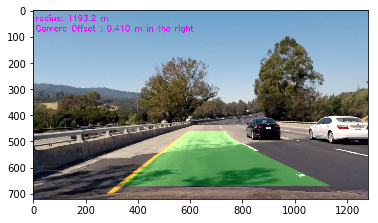

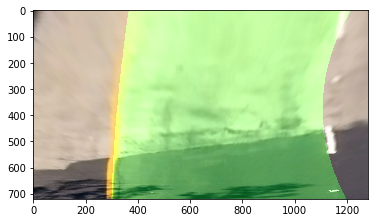

./output_images/test4.jpg
0.1347857142857143


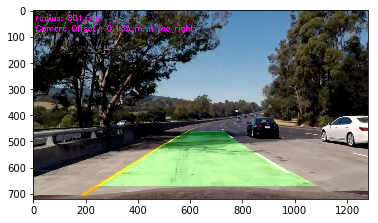

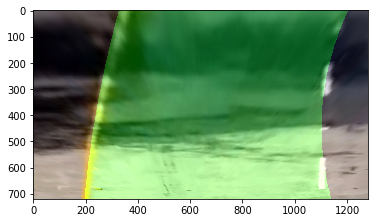

./output_images/test5.jpg
0.2563571428571429


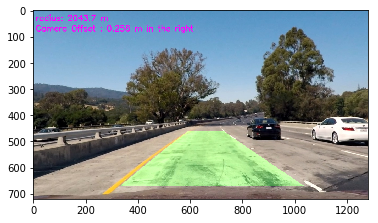

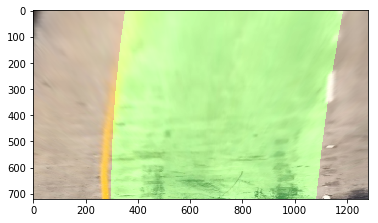

./output_images/test1.jpg
0.10571428571428572


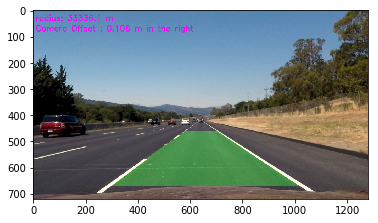

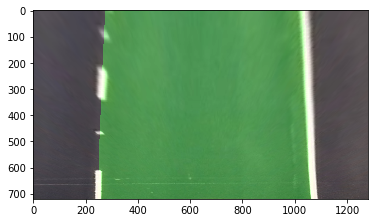

./output_images/straight_lines2.jpg
0.07928571428571429


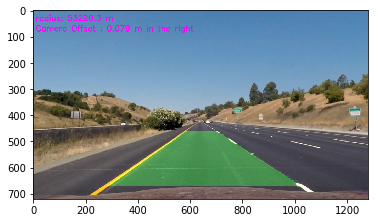

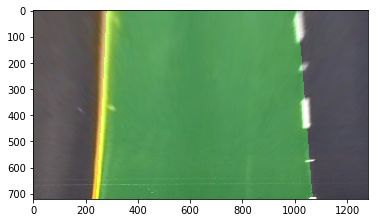

./output_images/straight_lines1.jpg
0.30392857142857144


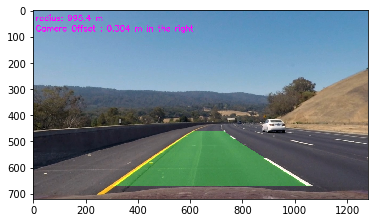

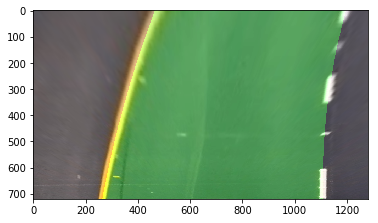

./output_images/test3.jpg
0.32771428571428574


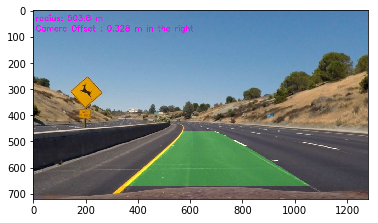

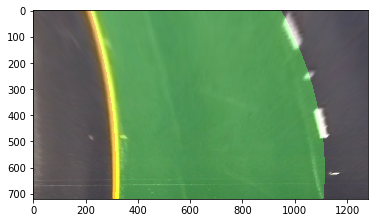

./output_images/test2.jpg


In [16]:
#####
# my pipeline 
# preprocessing : Undistort(Calibration) -->  Warping (includes RoI) --> Combined Thresholding
# histogram
def pipeline(img, display=False):
    # Undistort (Camera Calibration)
    undist = undistort_img(img)
    # Perspective Transform 
    warped = warp_img(undist)
    # Combined thresholded binar
    binary_warped = combined_thresholding(warped).astype(np.int32)
    # Fit lanes with sliding window mechanism
    left_fitx, right_fitx, ploty, left_fit, right_fit, leftx_base, rightx_base \
        = fit_poly_sliding_window(binary_warped)
    
    # Radius of curverture
    left_radius, right_radius = radius_of_curverture(left_fitx, right_fitx, ploty, left_fit, right_fit)
    radius_str = "radius: %.1f m"%((right_radius+left_radius)/2)
    
    # Lateral offset of cammea from center
    x_offset = lateral_offset(leftx_base, rightx_base, display==True)
    offset_str="Camera Offset : %.3f m in the "%x_offset
    if x_offset>=0:
        offset_str+="right"
    else:
        offset_str+="left"
    
    # zero image (gray)
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    # zero image (color)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # points of lanes
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right)).astype(np.int32)
    
    # fill inside the points of lanes
    cv2.fillPoly(color_warp, [pts], color=(0,255,0)) 
    
    # Dewarping with inverse warp matrix, "Minv"
    dewarped = warp_img(color_warp, Minv, binary_warped.shape) 
    
    # Overlay dewarped lane image on to udistorted original input
    out_img = cv2.addWeighted(undist, 1, dewarped, 0.3, 0)
    
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(out_img, radius_str,(10,40), font, 1,(255,0,255),2,cv2.LINE_AA)
    #cv2.putText(out_img,"left_radius : %.1f m"%left_radius,(10,80), font, 1,(255,0,255),2,cv2.LINE_AA)
    cv2.putText(out_img, offset_str,(10,80), font, 1,(255,0,255),2,cv2.LINE_AA)
        
    if display==True:
        out_warped = cv2.addWeighted(warped, 1, color_warp, 0.3, 0)
        plt.imshow(out_img)
        plt.show()
        plt.imshow(out_warped)
        plt.show()
    
    return out_img
    

out_dir = "./output_images/"
for i in range(num_test_file):
    img = test_img[i]
    img_name = test_file_list[i]
    out_img = pipeline(img, display=True)
    print (out_dir+img_name)
    cv2.imwrite(out_dir+img_name, cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR))


## Test on Videos


In [17]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [18]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    result = pipeline(image)
    return result

Let's try the one with the solid white lane on the right first ...

In [19]:

white_output = out_dir + 'output_video.mp4'
clip1 = VideoFileClip("./project_video.mp4")
white_clip = clip1.fl_image(process_image) 
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ./output_images/output_video.mp4
[MoviePy] Writing video ./output_images/output_video.mp4


100%|█████████▉| 1260/1261 [05:38<00:00,  3.64it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_images/output_video.mp4 

CPU times: user 7min 33s, sys: 4.56 s, total: 7min 37s
Wall time: 5min 38s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))